In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 

In [19]:
pip install cairocffi


  Using cached cairocffi-1.3.0-py3-none-any.whl
Note: you may need to restart the kernel to use updated packages.


In [19]:
pip install --upgrade python-igraph

  Created wheel for python-igraph: filename=python_igraph-0.9.11-py3-none-any.whl size=9074 sha256=a7233d5c05c00ac04602884431c7e7fa877f2f7b6da6ff7e34848f4b0eb83670
  Stored in directory: /Users/maria/Library/Caches/pip/wheels/7d/e4/0c/0c83f70bd0b99ce8aea47a21f8e52502169e7dd17808d12f30
Successfully built python-igraph
Note: you may need to restart the kernel to use updated packages.


In [3]:
import igraph as ig



In [2]:
from cairocffi import cairo

In [50]:
pip install cairocffi

     |████████████████████████████████| 88 kB 2.9 MB/s eta 0:00:011
  Created wheel for cairocffi: filename=cairocffi-1.3.0-py3-none-any.whl size=89668 sha256=3ae370f94a5cf718002021a1ee7e8fb6ea6cae0a87b864dea7016de4a850386f
  Stored in directory: /Users/maria/Library/Caches/pip/wheels/4e/ca/e1/5c8a9692a27f639a07c949044bec943f26c81cd53d3805319f
Successfully built cairocffi
Note: you may need to restart the kernel to use updated packages.


In [27]:
developers = pd.read_csv('developers.csv')
developers

,author_name,committer_name,author_date,committer_date,project_name
0,Rohan Varma,Facebook GitHub Bot,2021-10-24,2021-10-24,pytorch
1,Terry Heo,TensorFlower Gardener,2021-08-26,2021-08-26,tensorflow
2,A. Unique TensorFlower,TensorFlower Gardener,2021-10-27,2021-10-27,tensorflow
3,Jinliang Wei,TensorFlower Gardener,2021-08-31,2021-08-31,tensorflow
4,Isha Arkatkar,TensorFlower Gardener,2021-12-11,2021-12-11,tensorflow
5,Mike Iovine,Facebook GitHub Bot,2021-08-13,2021-08-13,pytorch
6,Adrian Kuegel,TensorFlower Gardener,2021-07-16,2021-07-16,tensorflow
7,Scott Wolchok,Facebook GitHub Bot,2021-09-13,2021-09-13,pytorch
8,Justin Lebar,TensorFlower Gardener,2021-07-09,2021-07-09,tensorflow
9,Raman Sarokin,TensorFlower Gardener,2021-12-16,2021-12-16,tensorflow


In [28]:
developers['from_to'] = list(zip(developers.author_name, developers.committer_name))
developers.head()

,author_name,committer_name,author_date,committer_date,project_name,from_to
0,Rohan Varma,Facebook GitHub Bot,2021-10-24,2021-10-24,pytorch,"(Rohan Varma, Facebook GitHub Bot)"
1,Terry Heo,TensorFlower Gardener,2021-08-26,2021-08-26,tensorflow,"(Terry Heo, TensorFlower Gardener)"
2,A. Unique TensorFlower,TensorFlower Gardener,2021-10-27,2021-10-27,tensorflow,"(A. Unique TensorFlower, TensorFlower Gardener)"
3,Jinliang Wei,TensorFlower Gardener,2021-08-31,2021-08-31,tensorflow,"(Jinliang Wei, TensorFlower Gardener)"
4,Isha Arkatkar,TensorFlower Gardener,2021-12-11,2021-12-11,tensorflow,"(Isha Arkatkar, TensorFlower Gardener)"


In [29]:
nodes1d = pd.DataFrame()
nodes2d = pd.DataFrame()

nodes1d = developers.copy()
nodes1d.drop(['committer_name', 'author_date', 'committer_date', 'project_name', 'from_to'], axis = 1, inplace = True)

nodes2d = developers.copy()
nodes2d.drop(['author_name', 'author_date', 'committer_date', 'project_name', 'from_to'], axis = 1, inplace = True)




/opt/anaconda3/envs/DMS/lib/python3.7/site-packages/ipykernel_launcher.py:16: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()


,author_name,committer_name
0,Rohan Varma,NaN
1,Terry Heo,NaN
2,A. Unique TensorFlower,NaN
3,Jinliang Wei,NaN
4,Isha Arkatkar,NaN
5,Mike Iovine,NaN
6,Adrian Kuegel,NaN
7,Scott Wolchok,NaN
8,Justin Lebar,NaN
9,Raman Sarokin,NaN


In [33]:

nodes1d.rename(columns={"author_name": "developers"}, inplace = True)

nodes2d.rename(columns={"committer_name": "developers"}, inplace = True)
              


In [35]:
nodesd = pd.concat([nodes1d, nodes2d], ignore_index = True)

nodesd.drop_duplicates(inplace = True)
nodesd

,developers
0,Rohan Varma
1,Terry Heo
2,A. Unique TensorFlower
3,Jinliang Wei
4,Isha Arkatkar
5,Mike Iovine
6,Adrian Kuegel
7,Scott Wolchok
8,Justin Lebar
9,Raman Sarokin


In [157]:
huge_developers = ['TensorFlower Gardener', 'Facebook GitHub Bot', 'GitHub', 'Samuel Marks', 'jagadeesh', 'lxning']



#nodesd['developers_huge'] = nodesd['developers_huge'].apply(lambda x: x if x in huge_developers)

In [227]:
labels = []
for i in range (len(huge_developers)):
    l = nodesd[nodesd['developers'] == huge_developers[i]].index.tolist()
    labels.append(l)

In [232]:
nodesd['developers_huge']=''

In [241]:
for i in range (4):
    nodesd['developers_huge'][labels[i][0]]=nodesd.at[labels[i][0], 'developers']
    

In [249]:
index_pytorch = developers.loc[developers['project_name']!='tensorflow'].index

index_tensorflow = developers.loc[developers['project_name']=='tensorflow'].index


In [251]:
Gd = ig.Graph.DictList(
          vertices=nodesd.to_dict('records'),
          edges=developers.to_dict('records'),
          directed=True,
          vertex_name_attr='developers',
          edge_foreign_keys=('committer_name', 'author_name'));

In [259]:
for i in range (len(index_pytorch)):
    Gd.es[index_pytorch[i]]["color"] = 'rgba(245, 138, 39, 0.3)'
    
for i in range (len(index_tensorflow)):
    Gd.es[index_tensorflow[i]]["color"] = 'rgba(39, 185, 245, 0.3)'   
    

In [260]:
h = ig.Graph.TupleList(developers.values,directed=True,
                       edge_attrs=developers.columns[2:])

In [261]:
nodes_dfd = nodesd.set_index(['developers'])
for column in nodes_dfd:
    h.vs[column] = nodes_dfd.loc[h.vs['name'],column]
    
nodes_dfd = nodesd.set_index(['developers'])

In [263]:
layout = h.layout_kamada_kawai()

In [264]:

ig.plot(Gd, "commiter2author_kawai2.pdf", layout=layout, vertex_size = 4, edge_width = 0.1, 
        edge_arrow_size = 0.5, vertex_label = nodesd['developers_huge'], vertex_label_size = 8)


In [199]:
layout4 = h.layout_fruchterman_reingold()

In [265]:
ig.plot(Gd, "commiter2author_7.pdf", layout=layout4, vertex_size = 2, edge_width = 0.1,
        edge_arrow_size = 0.5, vertex_label_size = 12, vertex_color='lightgrey', vertex_label = nodesd['developers_huge'],)

#color_dict = {"m": "blue", "f": "pink"}
#plot(g, layout=layout, vertex_color=[color_dict[gender] for gender in g.vs["gender"]])

In [188]:
layout5 = h.layout_lgl()

In [266]:
ig.plot(Gd, "commiter2author_5.pdf", layout=layout5, vertex_size = 2, edge_width = 0.1,
        edge_arrow_size = 0.5, vertex_label_size = 5, vertex_color='lightgrey')

In [269]:
nodes1d = pd.DataFrame()
nodes2d = pd.DataFrame()

nodes1d = developers.copy()
nodes1d.drop(['author_name', 'author_date', 'committer_date', 'project_name', 'from_to', 'color_edge'], axis = 1, inplace = True)

nodes2d = developers.copy()
nodes2d.drop(['author_name','committer_name', 'author_date', 'committer_date', 'from_to', 'color_edge'], axis = 1, inplace = True)

nodes1d.rename(columns={"committer_name": "node"}, inplace = True)

nodes2d.rename(columns={"project_name": "node"}, inplace = True)

nodes_p = pd.concat([nodes1d, nodes2d], ignore_index = True)

nodes_p.drop_duplicates(inplace = True)
nodes_p



,node
0,Facebook GitHub Bot
1,TensorFlower Gardener
12,george
15,Adam Lanicek
28,"Wang,Quintin"
30,Patrice Vignola
79,Rob Suderman
106,GitHub
124,Vignesh Kothapalli
127,feiwen.zfw


In [274]:
created_df = pd.read_csv('created.csv')
closed_df = pd.read_csv('closed.csv')
updated_df = pd.read_csv('updated.csv')

final = pd.concat([created_df,closed_df,updated_df], axis = 1 )

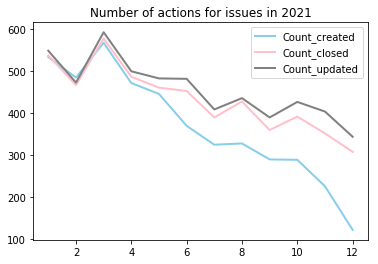

In [285]:
# libraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
 
# Data
df=final.copy() 
# multiple line plots
plt.plot( 'month_created', 'Count_created', data=df, marker='', markerfacecolor='blue', markersize=2, color='skyblue', linewidth=2)
plt.plot( 'month_created', 'Count_closed', data=df, marker='', color='pink', linewidth=2)
plt.plot( 'month_created', 'Count_updated', data=df, marker='', color='grey', linewidth=2, label="Count_updated")
plt.title('Number of actions for issues in 2021')

# show legend
plt.legend()

# show graph
plt.show()

In [290]:
torch_df = pd.read_csv('torch_issues.csv')
torch_df

,created_at,closed_at,difference
0,2017-04-04,2021-08-30,1609
1,2016-10-20,2021-03-17,1609
2,2017-02-08,2021-05-18,1560
3,2017-04-13,2021-06-30,1539
4,2017-11-27,2021-11-30,1464
5,2017-09-12,2021-08-30,1448
6,2017-05-30,2021-03-19,1389
7,2017-09-28,2021-07-06,1377
8,2017-12-08,2021-08-30,1361
9,2018-04-04,2021-12-08,1344


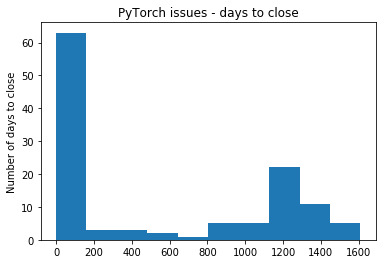

In [298]:
# libraries & dataset
import seaborn as sns
import matplotlib.pyplot as plt


plt.hist(data=torch_df, x="difference")
plt.title('PyTorch issues - days to close')
plt.ylabel('Number of issues')
plt.ylabel('Number of days to close')



plt.show()

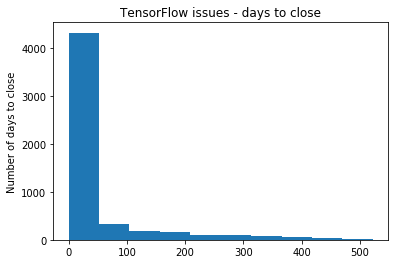

In [300]:
tensorflow_df = pd.read_csv('tensorflow.csv')

# libraries & dataset
import seaborn as sns
import matplotlib.pyplot as plt


plt.hist(data=tensorflow_df, x="difference")
plt.title('TensorFlow issues - days to close')
plt.ylabel('Number of issues')
plt.ylabel('Number of days to close')

plt.show()